<a href="https://colab.research.google.com/github/RaghadQadah/Text-Line-Extraction-for-Arabic-Handwritten-Documents/blob/main/TEXT_LINE_EXTRACTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Import required library** 

In [2]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display, clear_output

## **load input images**

In [3]:
image1 = cv2.imread("drive/My Drive/image.png")
image2 = cv2.imread("drive/My Drive/image2.png")
image3 = cv2.imread("drive/My Drive/image3.png")


## **show input images**

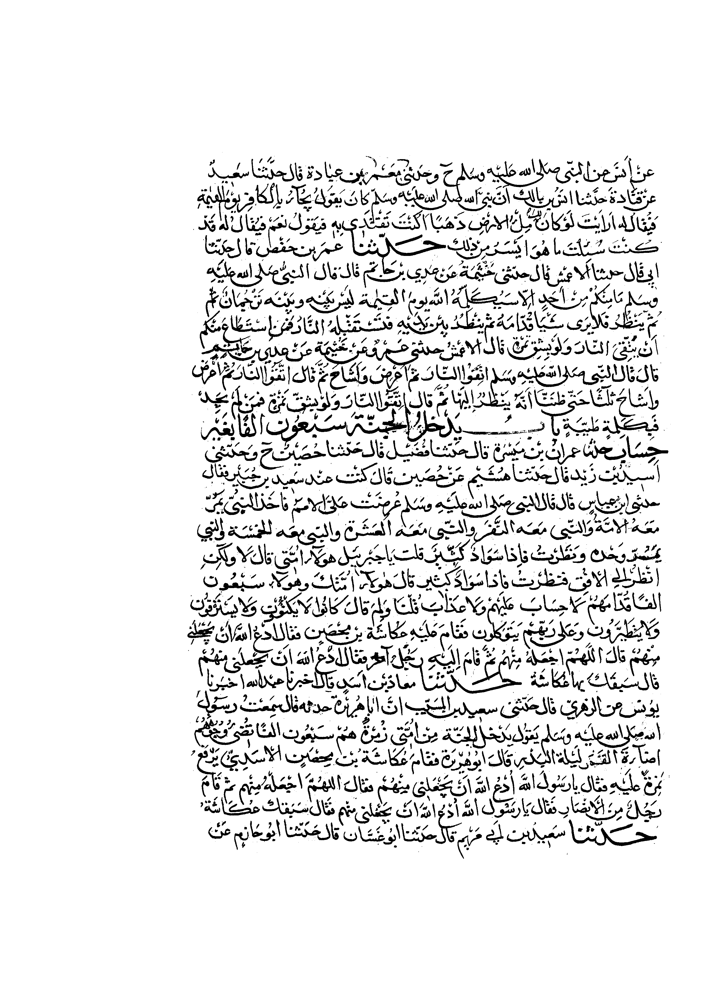

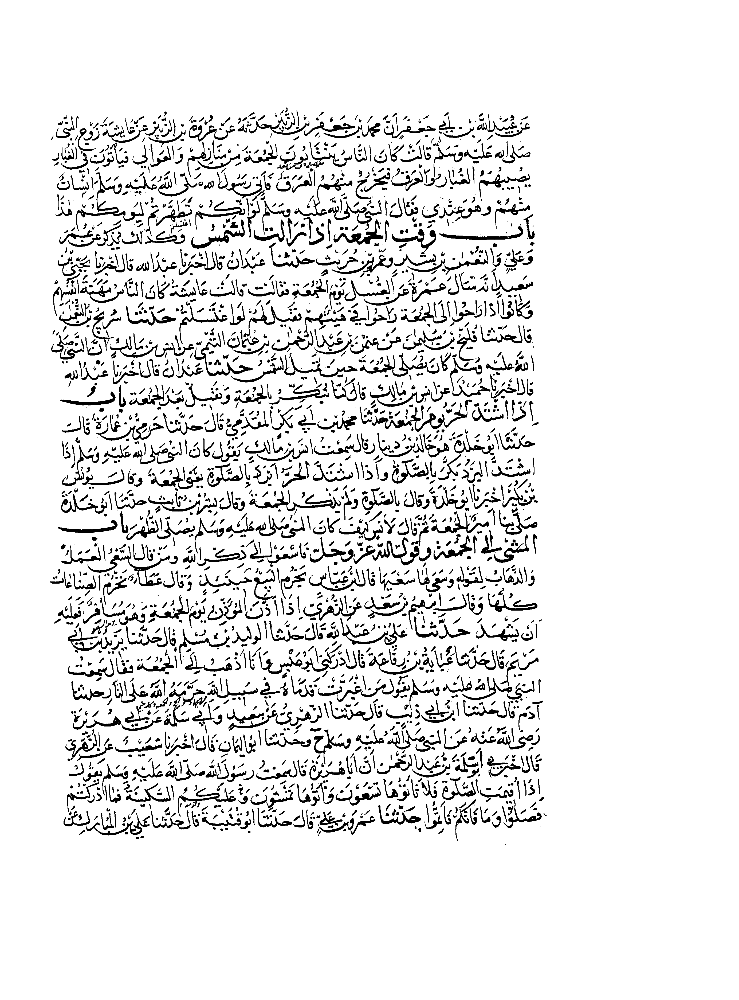

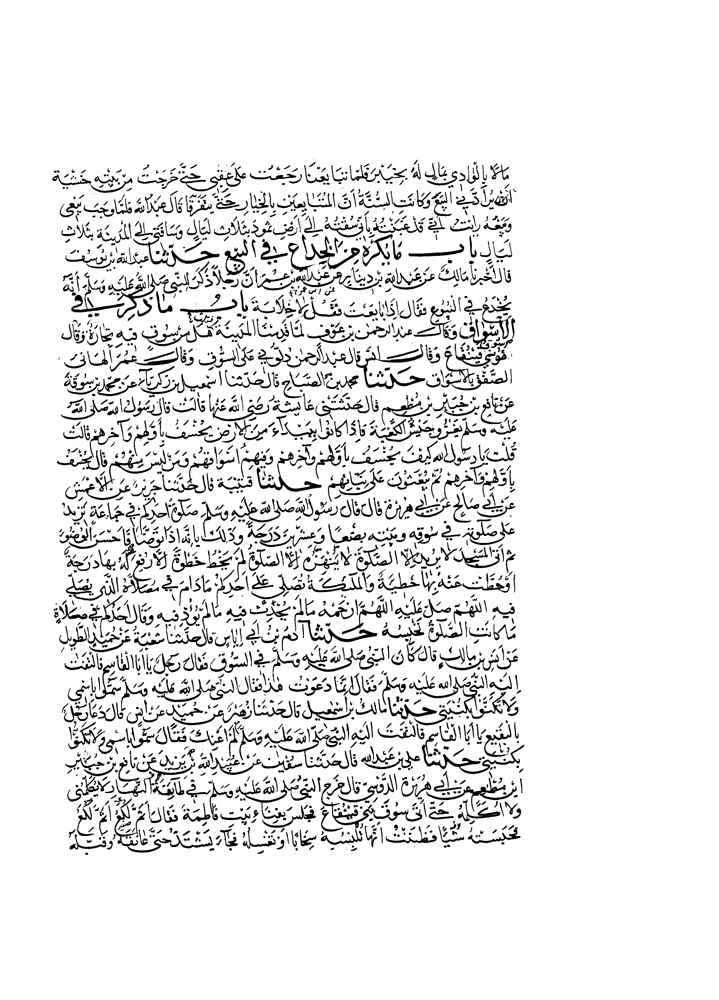

In [4]:
cv2_imshow(image1)
cv2_imshow(image2)
cv2_imshow(image3)

## **Save copies of images**

In [6]:
imgcpy1 = image1.copy()
imgcpy2=image2.copy()
imgcpy3=image3.copy()

# **images preprocessing and segmentation**

### **Gaussian Blur**

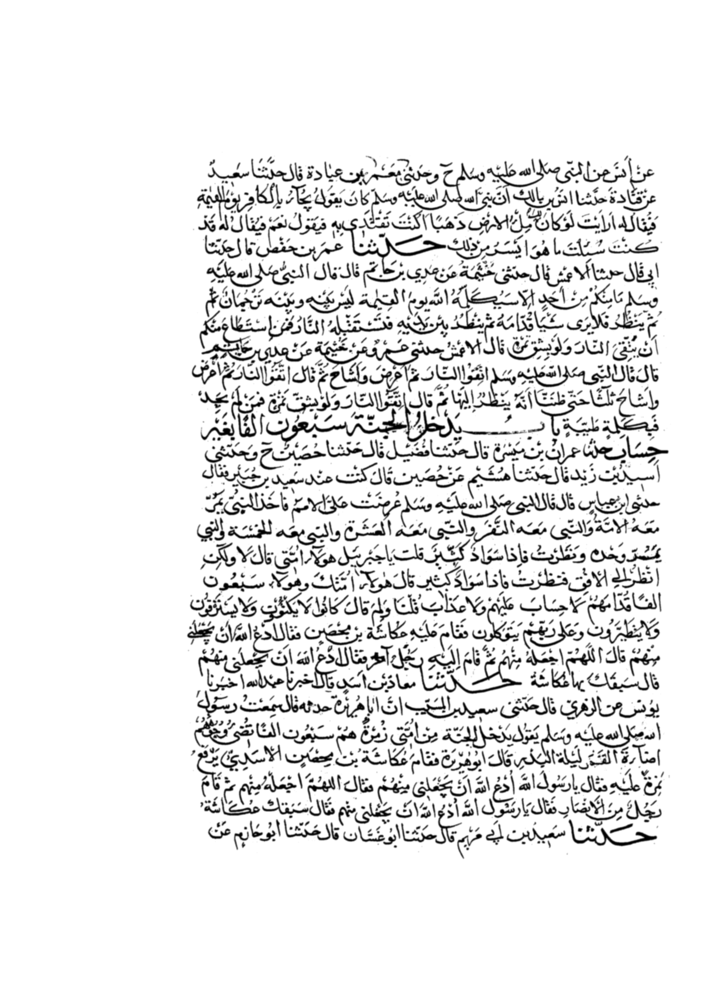

In [7]:
image1 = cv2.GaussianBlur(image1,(0,0), cv2.BORDER_REFLECT)
image2 = cv2.GaussianBlur(image2,(0,0), cv2.BORDER_REFLECT)
image3 = cv2.GaussianBlur(image3,(0,0), cv2.BORDER_REFLECT)
cv2_imshow(image1)


###  **Convert to Gray scale**

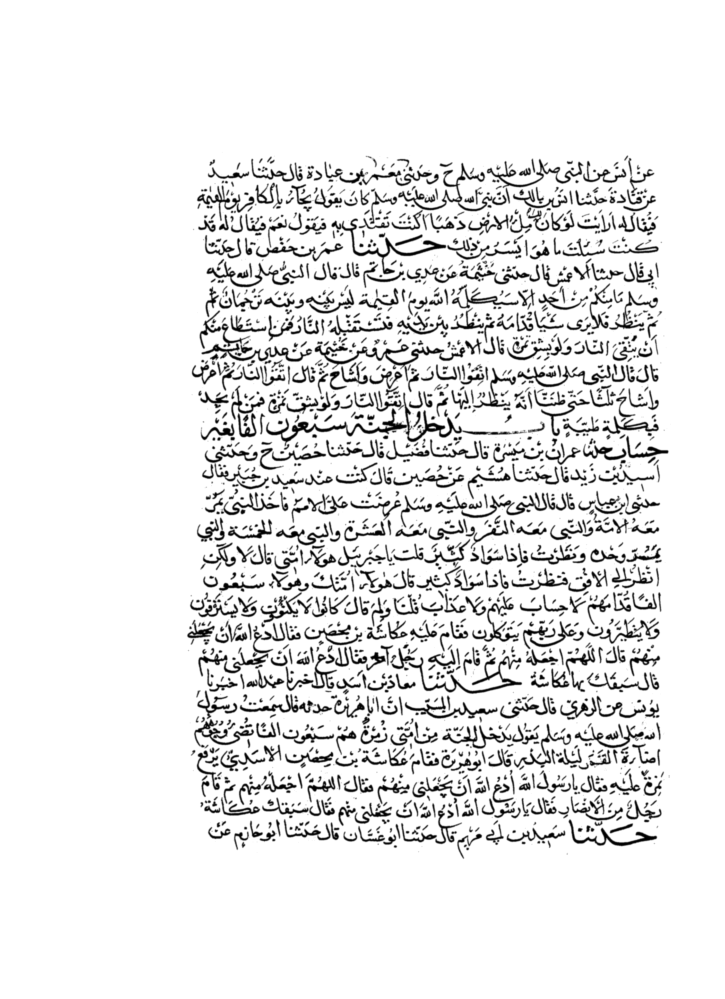

In [8]:
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
gray3 = cv2.cvtColor(image3, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray1)

### **Gamma-Correlation**

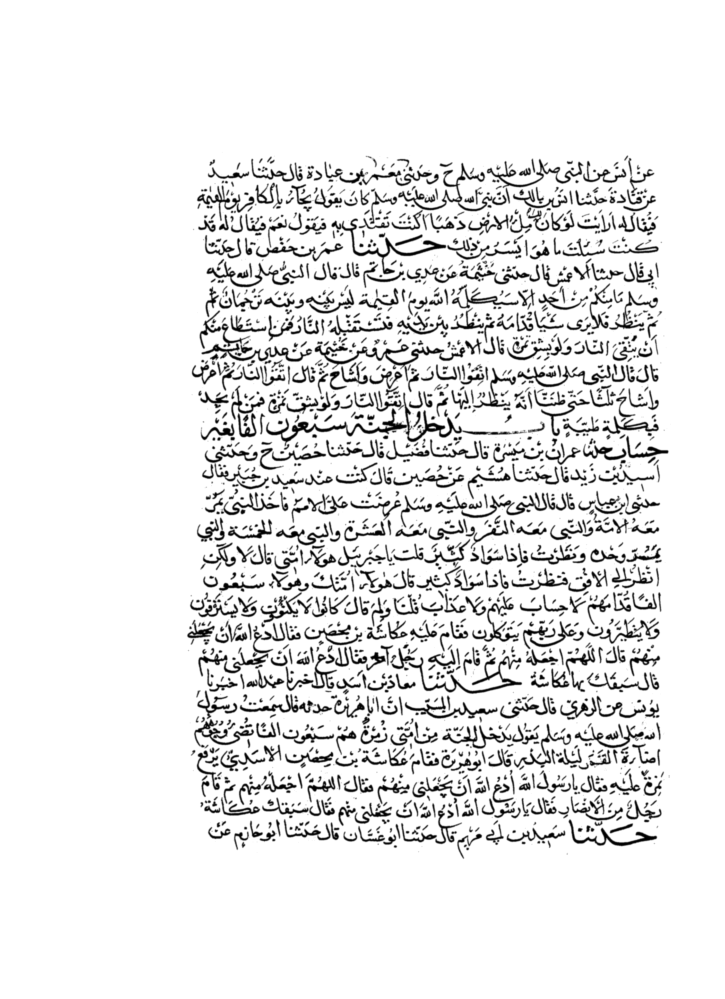

In [10]:
gray1 = np.array(255 * (gray1 / 255) ** 1 , dtype='uint8')
gray2 = np.array(255 * (gray2 / 255) ** 1 , dtype='uint8')
gray3 = np.array(255 * (gray3 / 255) ** 1 , dtype='uint8')
cv2_imshow(gray1)

### **Threshold**

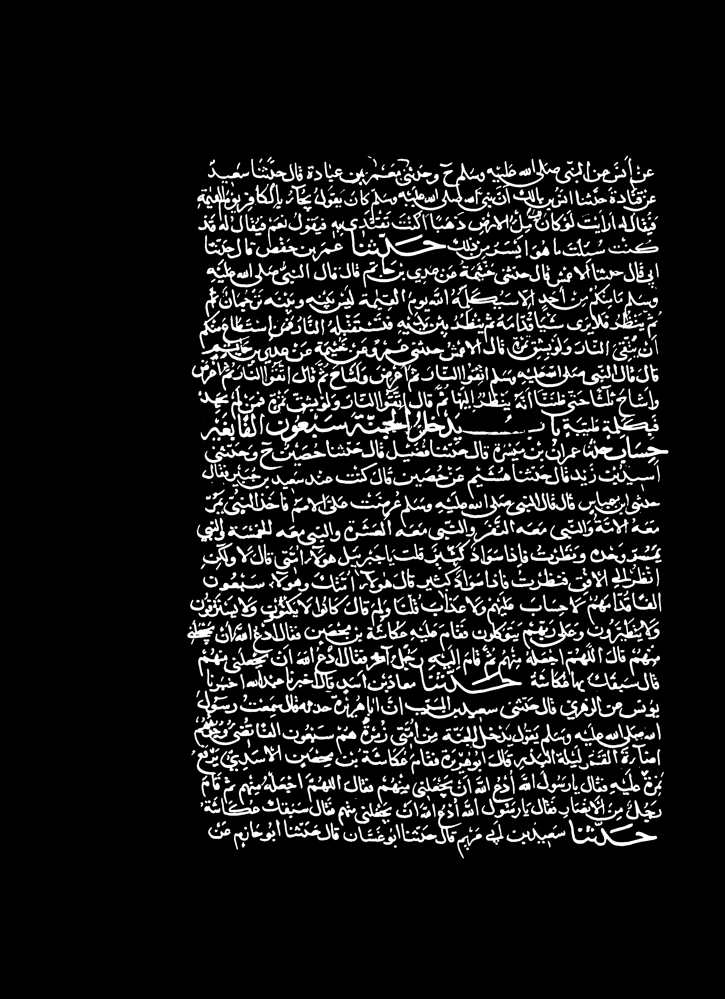

In [11]:
ret1,thresh1 = cv2.threshold(gray1, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
ret2,thresh2 = cv2.threshold(gray2, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
ret3,thresh3 = cv2.threshold(gray3, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
cv2_imshow(thresh1)

### **Get large Contours**



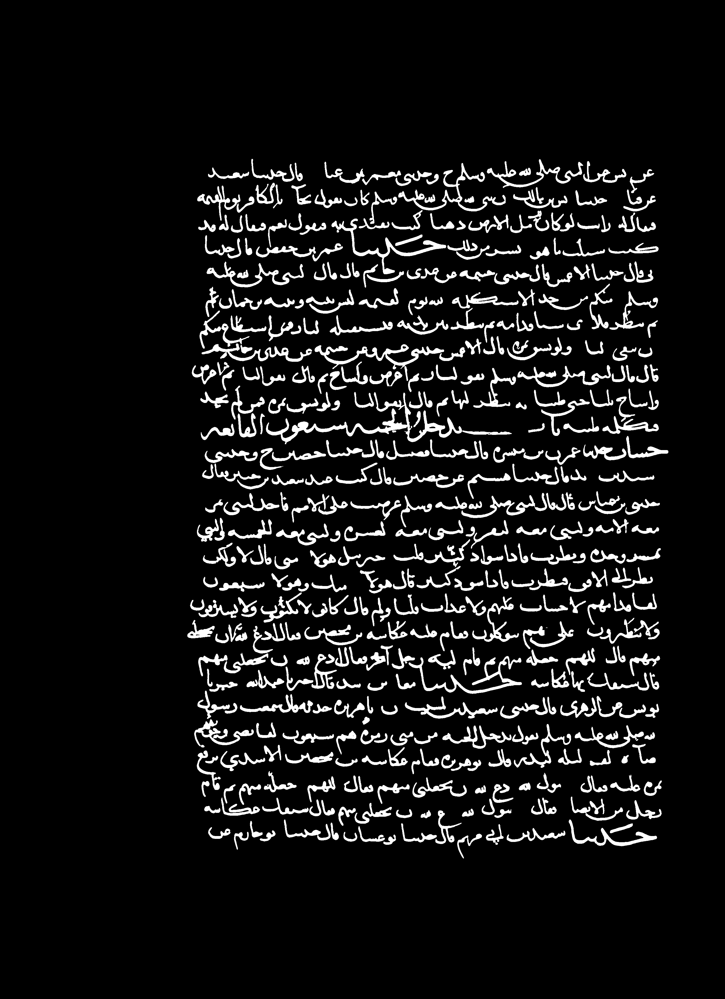

In [12]:
cnts = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 500:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(thresh1, (x, y), (x + w, y + h), (0,0,0), -1)

cnts = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 500:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(thresh2, (x, y), (x + w, y + h), (0,0,0), -1)

cnts = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 500:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(thresh3, (x, y), (x + w, y + h), (0,0,0), -1)



cv2_imshow(thresh1)

### **Opening Operation**

In [13]:
def opening(thresh):
  open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20,1))
  open = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, open_kernel, iterations=1)
  return open


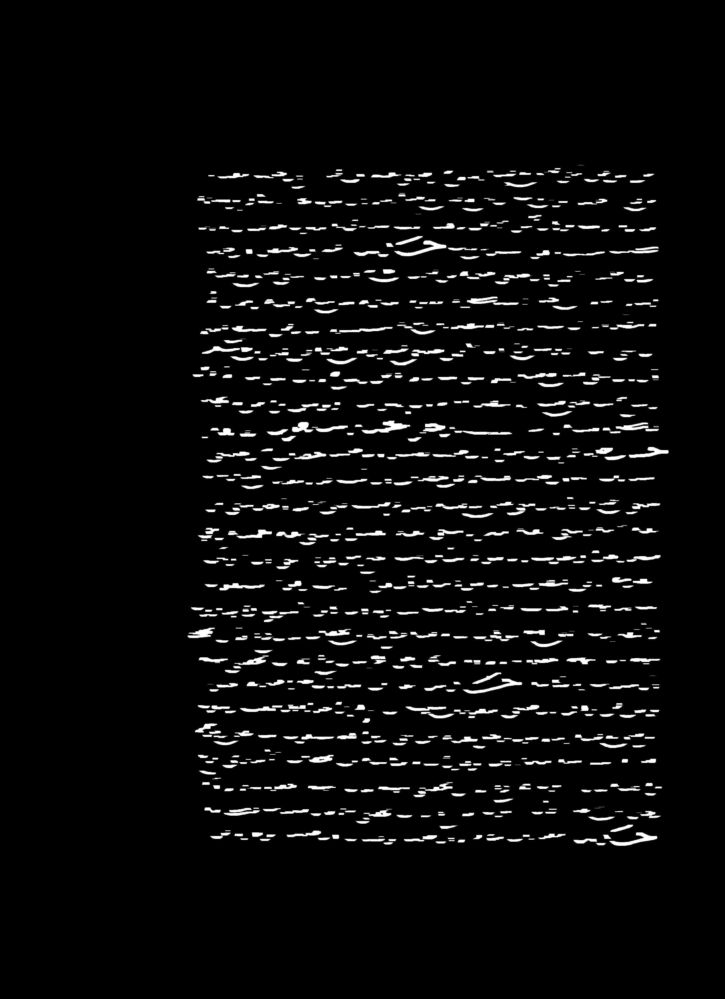

In [14]:
open1=opening(thresh1)
open2=opening(thresh2)
open3=opening(thresh3)

cv2_imshow(open1)



### **dilation Operation**

In [16]:
def dilation(thresh):

  dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,1))
  dilate = cv2.dilate(thresh, dilate_kernel, iterations=4)
  return dilate

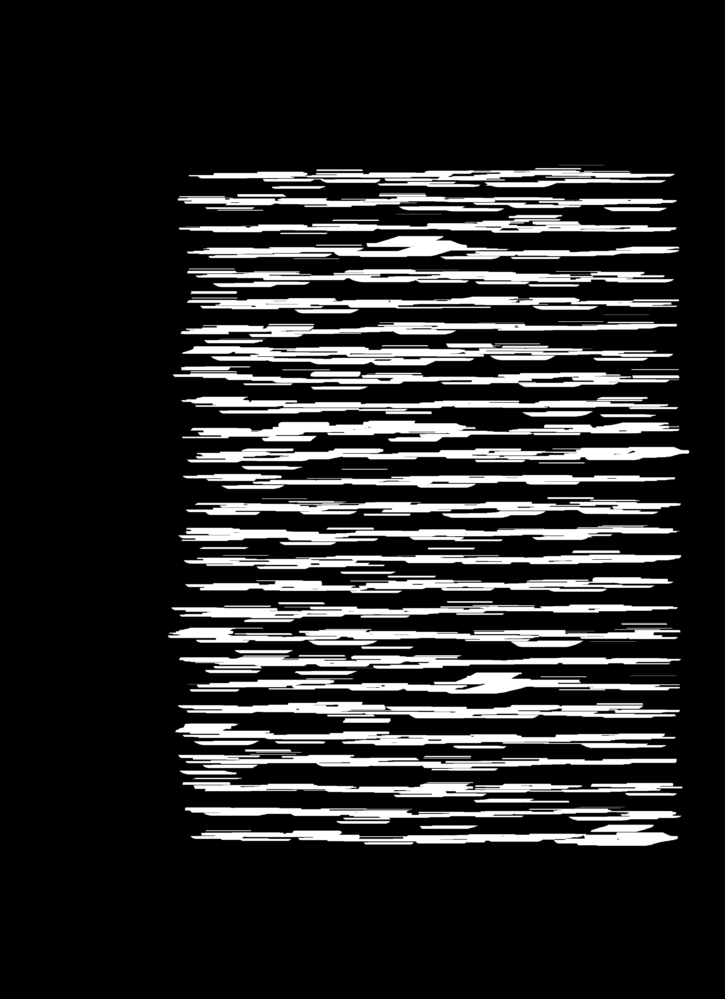

In [17]:
dilate1=dilation(open1)
dilate2=dilation(open2)
dilate3=dilation(open3)
cv2_imshow(dilate1)

### **Get large Contours**

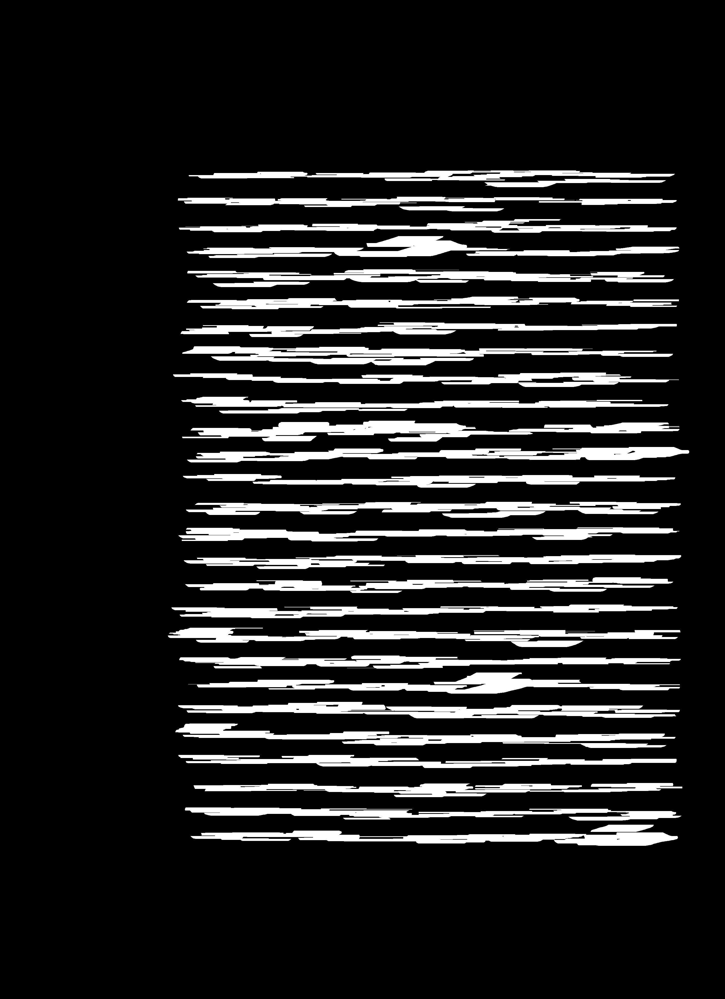

In [18]:
cnts = cv2.findContours(dilate1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 5000:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(dilate1, (x, y), (x + w, y + h), (0,0,0), -1)


cnts = cv2.findContours(dilate2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 5000:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(dilate2, (x, y), (x + w, y + h), (0,0,0), -1)



cnts = cv2.findContours(dilate3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 5000:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(dilate3, (x, y), (x + w, y + h), (0,0,0), -1)
cv2_imshow(dilate1)


### **Blurring Operation**

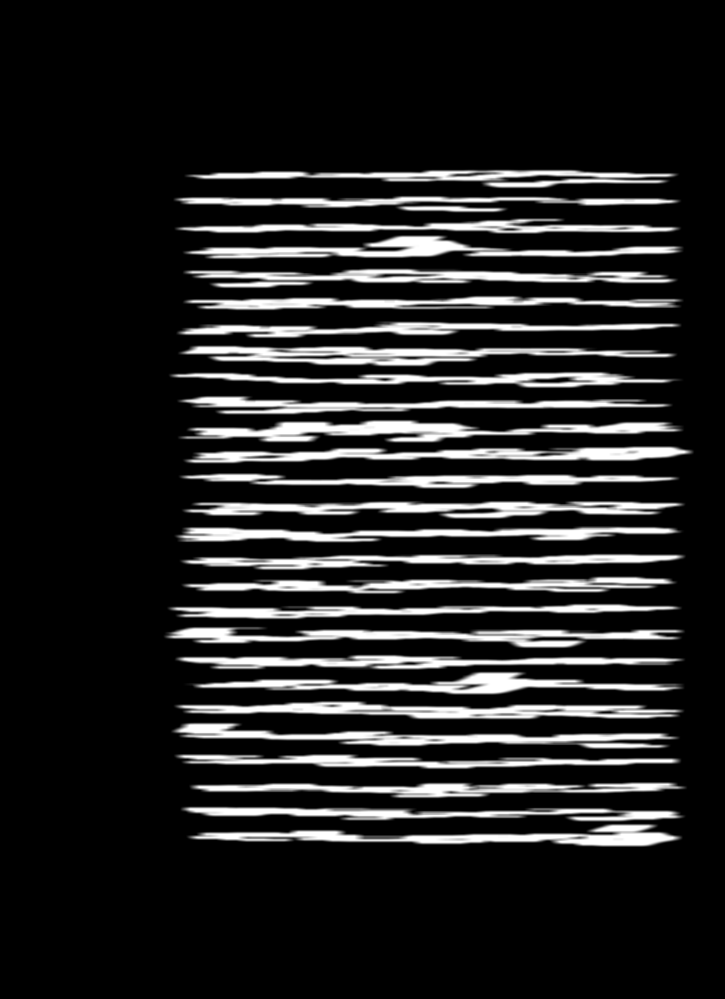

In [21]:
blurr1=cv2.blur(dilate1, ksize=(40,10))
blurr2=cv2.blur(dilate2, ksize=(40,10))
blurr3=cv2.blur(dilate3, ksize=(40,10))
cv2_imshow(blurr1)

### **Threshold Operation**


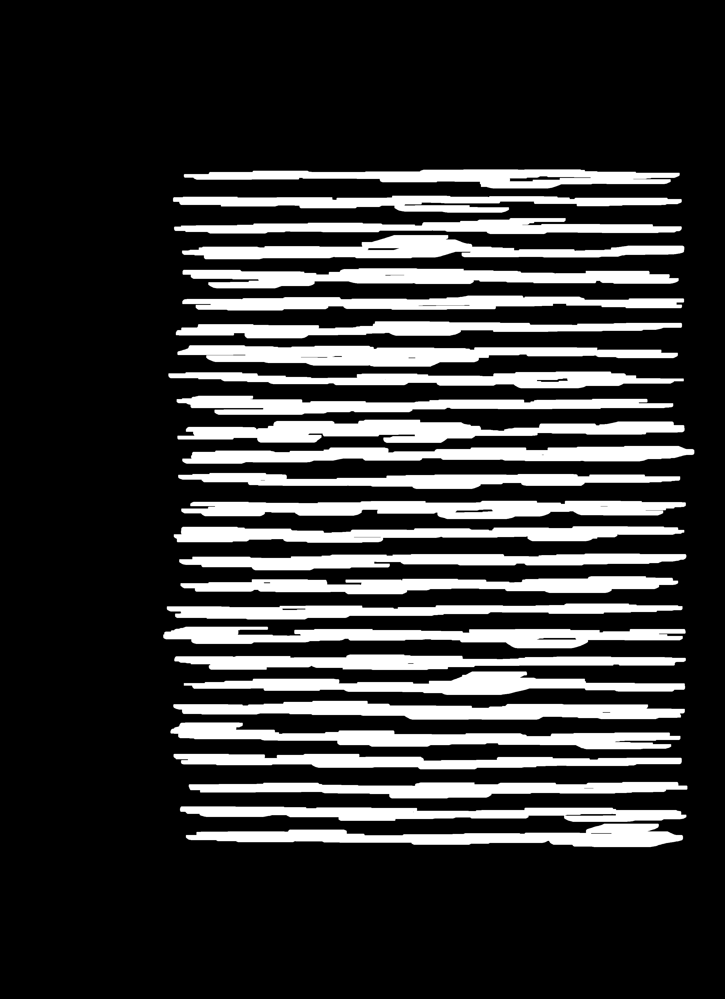

In [22]:
_,line_Text1 = cv2.threshold(blurr1,1,255,cv2.THRESH_BINARY)
_,line_Text2 = cv2.threshold(blurr2,1,255,cv2.THRESH_BINARY)
_,line_Text3 = cv2.threshold(blurr3,1,255,cv2.THRESH_BINARY)
cv2_imshow(line_Text1)


### **get white Background**

In [33]:
imWhite1=np.full(imgcpy1.shape, (255,255,255), np.uint8)
imWhite2=np.full(imgcpy2.shape, (255,255,255), np.uint8)
imWhite3=np.full(imgcpy3.shape, (255,255,255), np.uint8)

### **Draw Lines Contour**

In [31]:
def DrawLinesContour(line_Text,imWhite,imgcpy):
  (contText, _) = cv2.findContours(line_Text, cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
  i=0;f=0;f2=0
  for c in contText:

    area=cv2.contourArea(c)
    x, y, w, h = cv2.boundingRect(c)

    if area > 5000:
      i+=1
      cv2.putText(imgcpy, "line"+str(i), (x + w, y + h ), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0), 5) 
      X =x-20;Y=y- 20

      if i % 10 == 0:
          cv2.rectangle(imWhite, (X, Y), (x + w, y + h), (255, 255, 100), -1)

      elif i % 4 == 0:
            cv2.rectangle(imWhite, (X, Y), (x + w, y + h), (255, 0, 0), -1)

      elif i % 3 == 0:
            cv2.rectangle(imWhite, (X, Y), (x + w , y + h ), (0, 255, 255), -1)

      else:
            if f==0:
                cv2.rectangle(imWhite,(X, Y), (x + w, y + h),(0, 0, 255), -1)
                f=1
            elif f==1 and f2==0:
                cv2.rectangle(imWhite, (X, Y), (x + w , y + h ), (255, 0, 255), -1)
                f = 0
                f2=1
            else:
                
                cv2.rectangle(imWhite,(X, Y), (x + w , y + h ), (0, 255, 0), -1)
                f2=0
  return imWhite

### **Merge contoured background with origin image**

In [34]:
RecImage1=DrawLinesContour(line_Text1,imWhite1,imgcpy1)
RecImage2=DrawLinesContour(line_Text2,imWhite2,imgcpy2)
RecImage3=DrawLinesContour(line_Text3,imWhite3,imgcpy3)

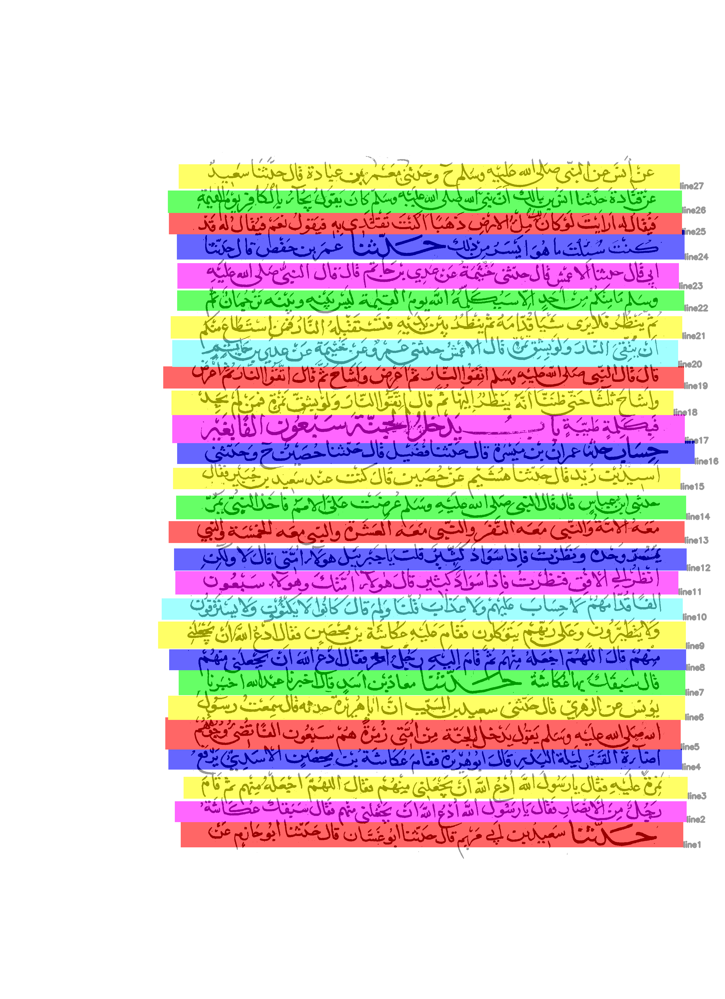

In [35]:
alpha=.6
cv2.addWeighted(RecImage1, alpha, imgcpy1, 1 - alpha,0, imgcpy1)
cv2_imshow(imgcpy1)


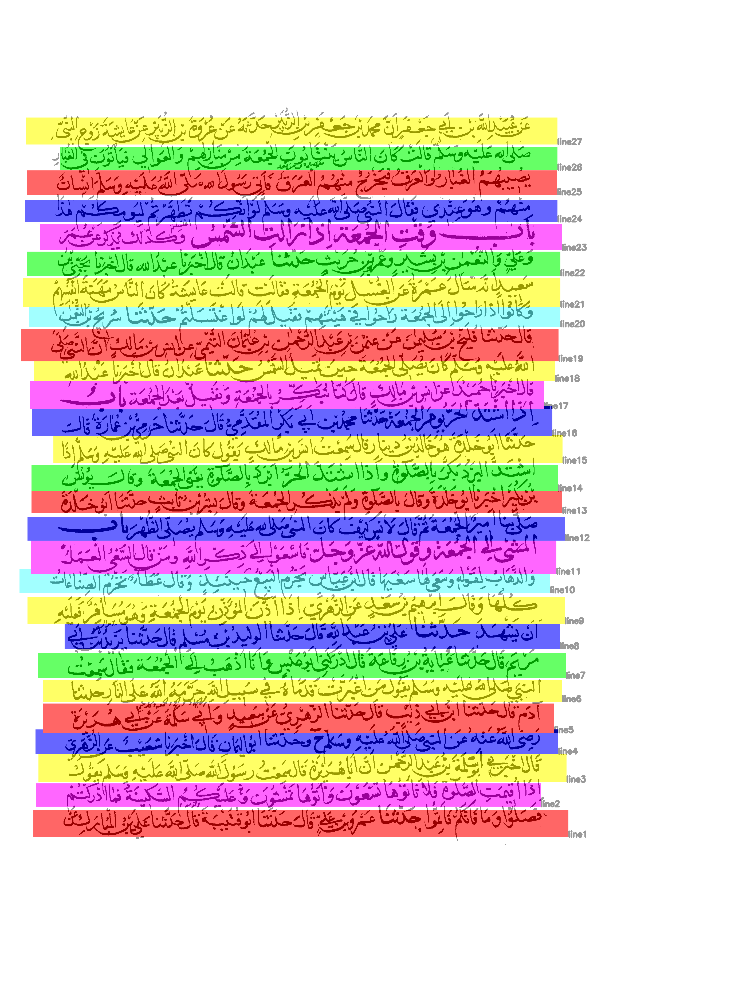

In [36]:
alpha=.6
cv2.addWeighted(RecImage2, alpha, imgcpy2, 1 - alpha,0, imgcpy2)
cv2_imshow(imgcpy2)

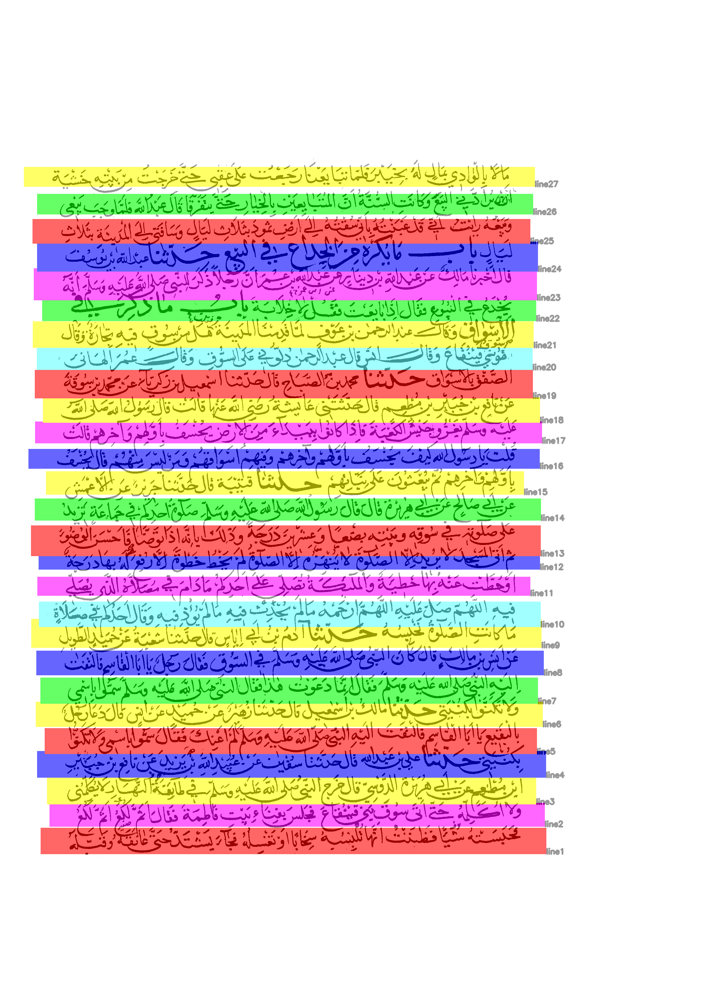

In [37]:
alpha=.6
cv2.addWeighted(RecImage3, alpha, imgcpy3, 1 - alpha,0, imgcpy3)
cv2_imshow(imgcpy3)